# Example 4

This notebook generates events inside the MicroBooNE cryostat.

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

import DarkNews as dn
from DarkNews import GenLauncher

import ToyAnalysis as ta

import ToyAnalysis.analysis as a
import ToyAnalysis.analysis_decay as an

#### We start by generating events for four benchmark points inside the MicroBooNE cryostat. 

In [4]:
kwargs = {  
        'neval': 1e4,
        'HNLtype': 'dirac',
        # 'hepevt': True,
        # 'unweighted_hep_events': 1000,
        # 'hep_unweight': True,
        'experiment': 'microboone',
        'nopelastic': True,
        'pandas': False,
        'loglevel': 'WARNING'
        }

gen_object = GenLauncher(mzprime=0.030, m4=0.150, **kwargs)
gen_object.run()
df1 = gen_object.df

gen_object = GenLauncher(mzprime=1.25, m4=0.150, **kwargs)
gen_object.run()
df2 = gen_object.df

gen_object = GenLauncher(mzprime=0.03, m5=0.150, m4=0.107, **kwargs)
gen_object.run()
df3 = gen_object.df

gen_object = GenLauncher(mzprime=1.25, m5=0.150, m4=0.107, **kwargs)
gen_object.run()
df4 = gen_object.df

In [5]:
events=dn.geom.microboone_geometry(df1)

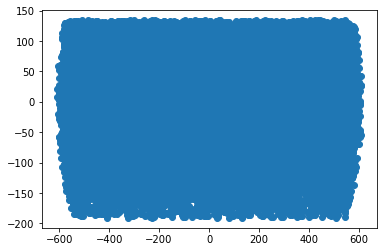

In [6]:
plt.scatter(df1['pos_scatt','3'],df1['pos_scatt','2'])

In [7]:
# we get crazy numbers because we didn't set the couplings to reasonable values

print(f"Total upscattering events for BP1 {df1['w_event_rate'].sum():.2E}")
print(f"Total upscattering events for BP2 {df2['w_event_rate'].sum():.2E}")
print(f"Total upscattering events for BP3 {df3['w_event_rate'].sum():.2E}")
print(f"Total upscattering events for BP4 {df4['w_event_rate'].sum():.2E}")

Total upscattering events for BP1 7.04E+05
Total upscattering events for BP2 3.65E+00
Total upscattering events for BP3 7.07E+05
Total upscattering events for BP4 4.00E+00


In [9]:
# we set some useful parameters and compute which events occur in the active detector of MicroBooNE

df1 = an.set_params(df1)
df2 = an.set_params(df2)
df3 = an.set_params(df3)
df4 = an.set_params(df4)

df1_decay = an.decay_selection(df1, l_decay_proper_cm = df1.attrs['N4_ctau0'], experiment='microboone')
df2_decay = an.decay_selection(df2, l_decay_proper_cm = df2.attrs['N4_ctau0'], experiment='microboone')
df3_decay = an.decay_selection(df3, l_decay_proper_cm = df3.attrs['N5_ctau0'], experiment='microboone')
df4_decay = an.decay_selection(df4, l_decay_proper_cm = df4.attrs['N5_ctau0'], experiment='microboone')

/Users/matheushostert/Repos/DarkNews-generator/examples/ToyAnalysis/analysis_decay.py:80: RuntimeWarning: invalid value encountered in sqrt
  M = np.sqrt(dot4(p.T, p.T))
/Users/matheushostert/Repos/DarkNews-generator/examples/ToyAnalysis/analysis_decay.py:80: RuntimeWarning: invalid value encountered in sqrt
  M = np.sqrt(dot4(p.T, p.T))
/Users/matheushostert/Repos/DarkNews-generator/examples/ToyAnalysis/analysis_decay.py:80: RuntimeWarning: invalid value encountered in sqrt
  M = np.sqrt(dot4(p.T, p.T))
/Users/matheushostert/Repos/DarkNews-generator/examples/ToyAnalysis/analysis_decay.py:80: RuntimeWarning: invalid value encountered in sqrt
  M = np.sqrt(dot4(p.T, p.T))


#### Looking at the geometry of the scattering positions: XY plane

/usr/local/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


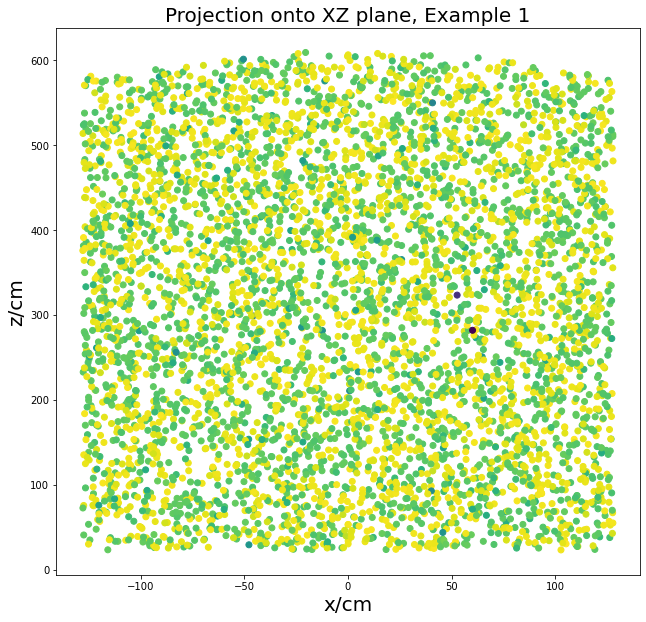

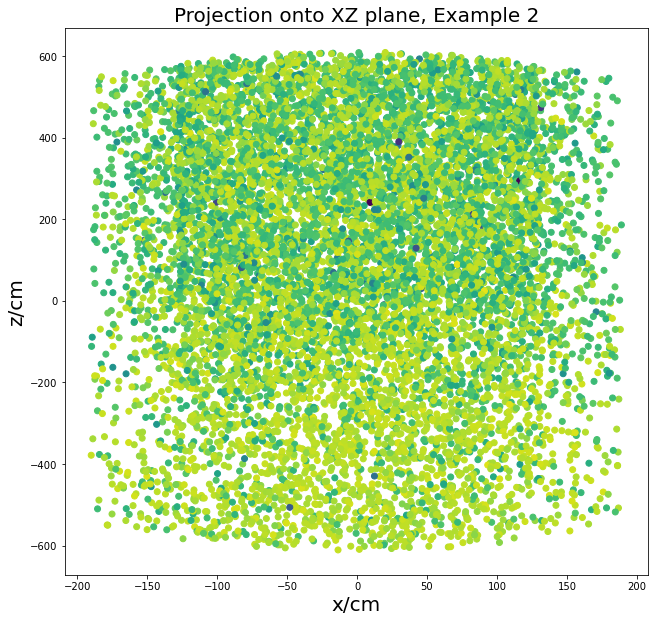

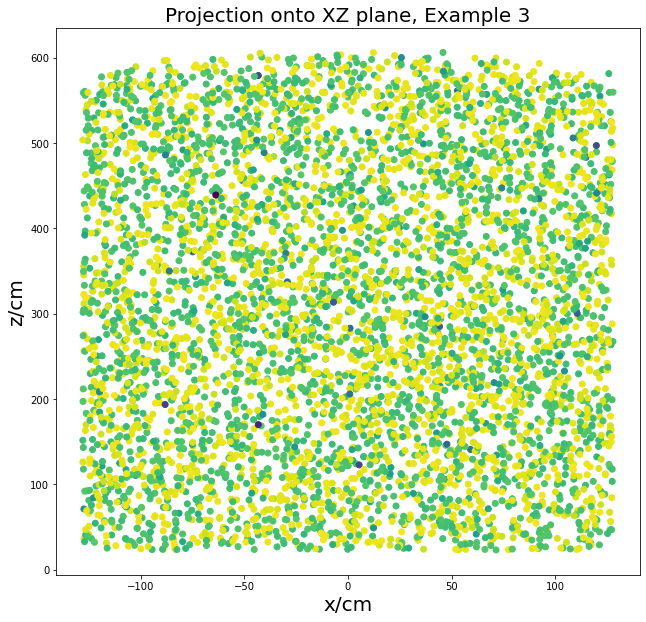

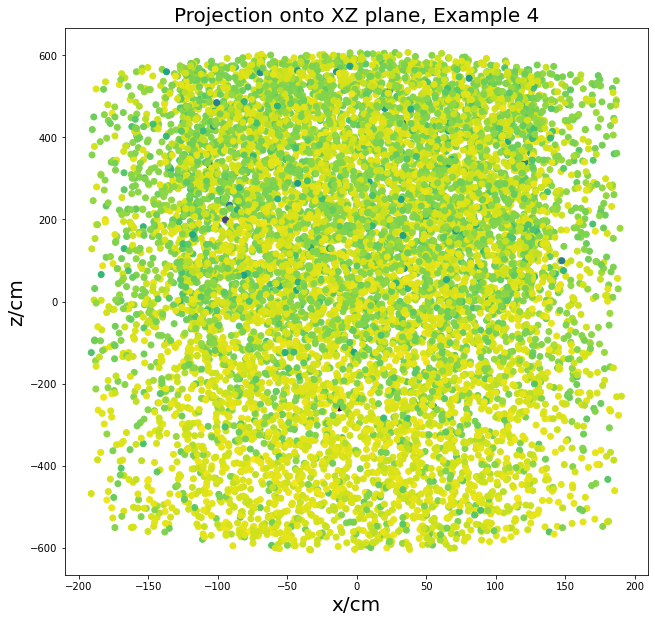

In [10]:
bp_list = ['1','2','3','4']
df_list = [df1_decay,df2_decay,df3_decay,df4_decay]

for case in range(4):
    bp = bp_list[case]
    df_scat = df_list[case].copy(deep=True)
    title = r"Projection onto XZ plane, Example " + bp
    xlabel = r'x/cm'
    ylabel = r'z/cm'
    
    axes_form  =[0.16,0.16,0.81,0.76]
    fig = plt.figure(figsize=(10,10))
    ax = fig.add_axes(axes_form, rasterized=False)
    ax.patch.set_alpha(0.0)
    plt.scatter(df_scat['pos_scatt','1'], df_scat['pos_scatt','3'], c=np.log10(df_scat['w_event_rate']))
    ax.set_title(title,   fontsize=20)
    ax.set_xlabel(xlabel, fontsize=20)
    ax.set_ylabel(ylabel, fontsize=20)

In [31]:
df_scat.columns.levels[0]

Index(['P_decay_N_daughter', 'P_decay_N_parent', 'P_decay_ell_minus',
       'P_decay_ell_plus', 'P_projectile', 'P_recoil', 'P_target', 'pos_scatt',
       'w_decay_rate_0', 'w_event_rate', 'w_flux_avg_xsec', 'target',
       'target_pdgid', 'projectile_pdgid', 'scattering_regime', 'helicity',
       'underlying_process', 'h_projectile', 'h_parent', 'pos_decay',
       'reco_theta_beam', 'reco_Evis', 'reco_w', 'reco_Enu', 'w_pre_decay'],
      dtype='object')

/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/usr

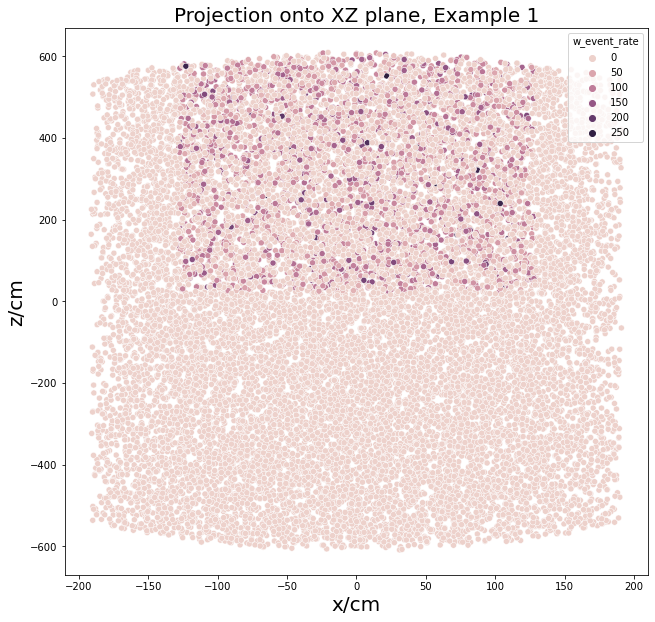

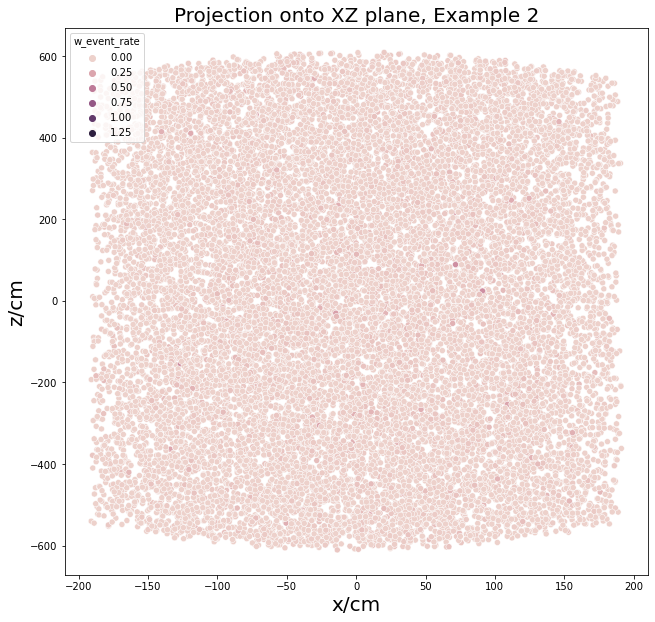

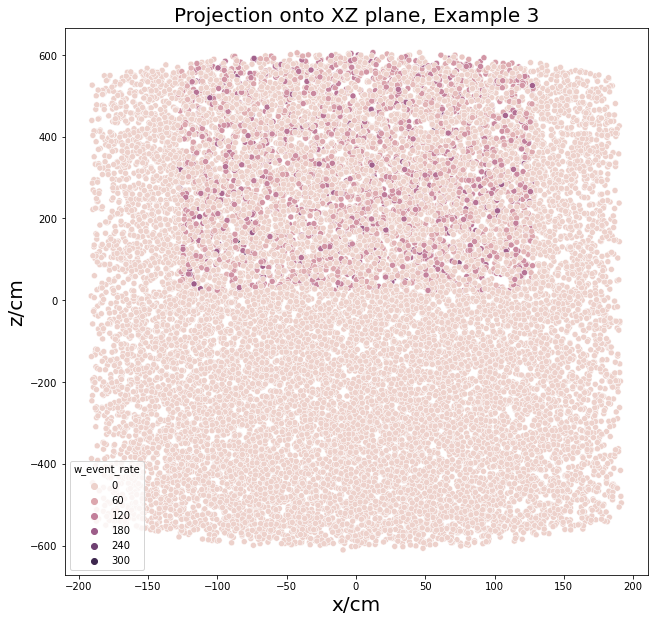

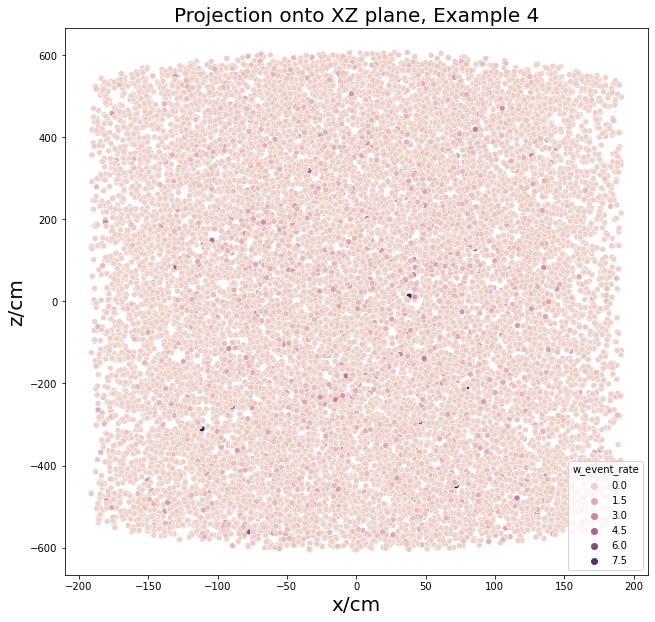

In [40]:
bp_list = ['1','2','3','4']
df_list = [df1_decay,df2_decay,df3_decay,df4_decay]

for case in range(4):
    bp = bp_list[case]
    df_scat = df_list[case].copy(deep=True)
    title = r"Projection onto XZ plane, Example " + bp
    xlabel = r'x/cm'
    ylabel = r'z/cm'
    
    axes_form  =[0.16,0.16,0.81,0.76]
    fig = plt.figure(figsize=(10,10))
    ax = fig.add_axes(axes_form, rasterized=False)
    ax.patch.set_alpha(0.0)

    sns.scatterplot(df_scat['pos_scatt', '1'], df_scat['pos_scatt', '3'], hue=df_scat['w_event_rate'])
    ax.set_title(title,   fontsize=20)
    ax.set_xlabel(xlabel, fontsize=20)
    ax.set_ylabel(ylabel, fontsize=20)

/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/usr

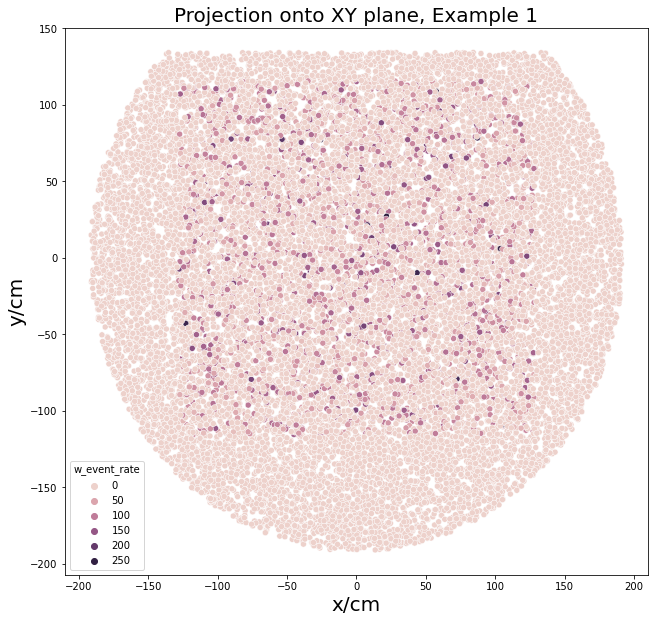

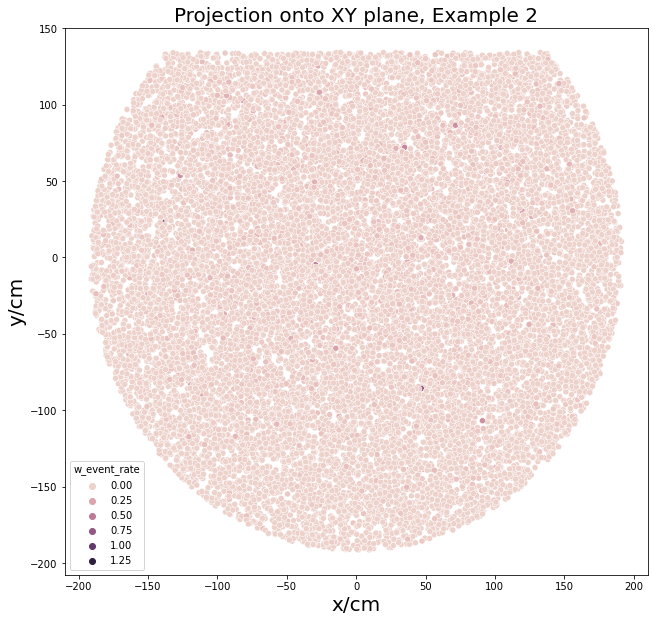

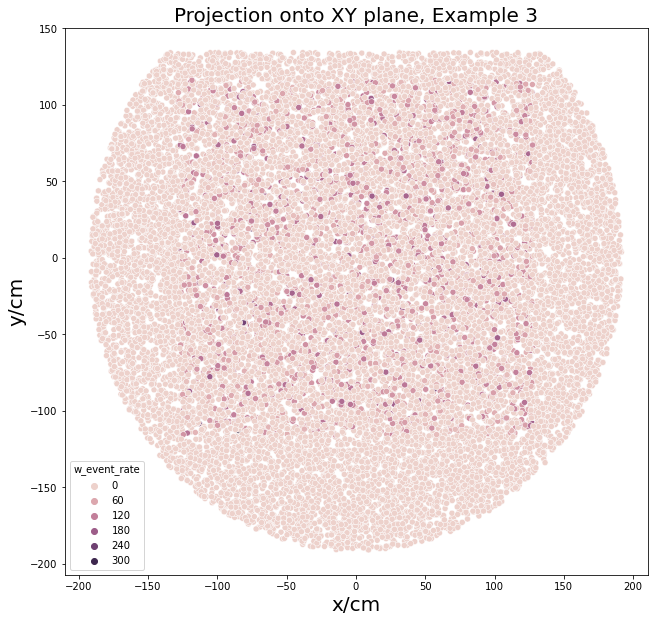

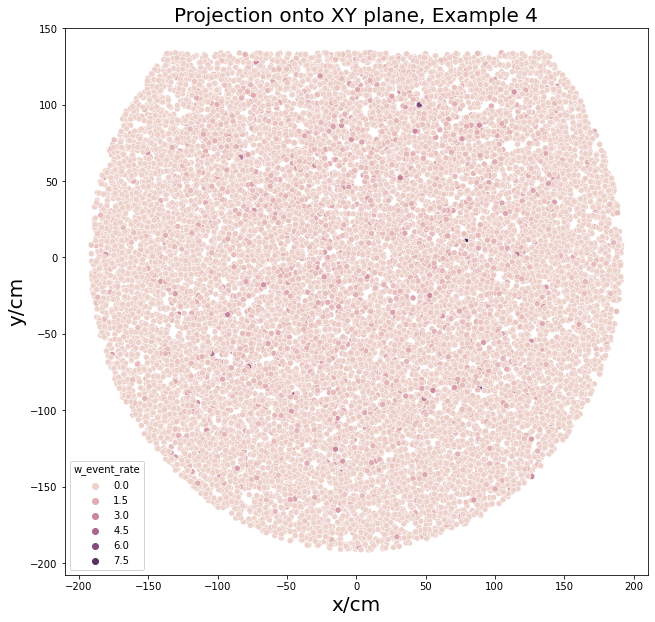

In [42]:
bp_list = ['1','2','3','4']
df_list = [df1_decay,df2_decay,df3_decay,df4_decay]

for case in range(4):
    bp = bp_list[case]
    df_scat = df_list[case].copy(deep=True)
    title = r"Projection onto XY plane, Example " + bp
    xlabel = r'x/cm'
    ylabel = r'y/cm'
    
    axes_form  =[0.16,0.16,0.81,0.76]
    fig = plt.figure(figsize=(10,10))
    ax = fig.add_axes(axes_form, rasterized=False)
    ax.patch.set_alpha(0.0)
    sns.scatterplot(df_scat['pos_scatt', '1'], df_scat['pos_scatt', '2'], hue=df_scat['w_event_rate'])    
    ax.set_title(title,fontsize=20)
    ax.set_xlabel(xlabel,fontsize=20)
    ax.set_ylabel(ylabel,fontsize=20)

#### Looking at the geometry of the scattering positions: YZ plane

/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/usr

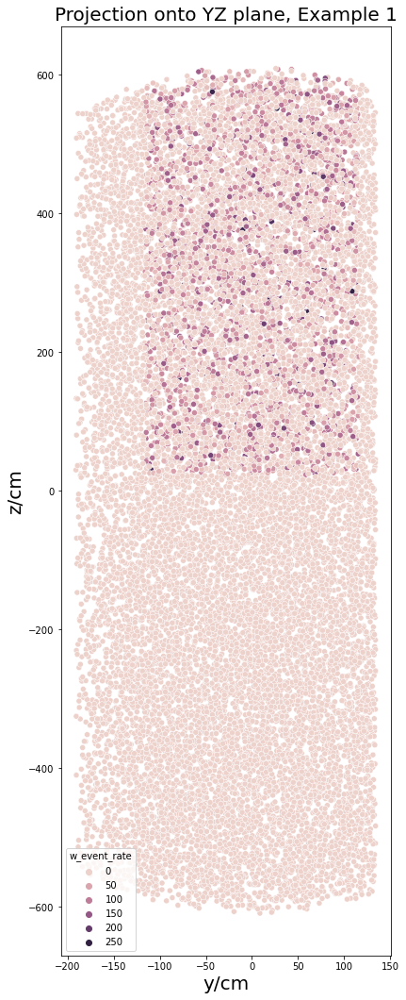

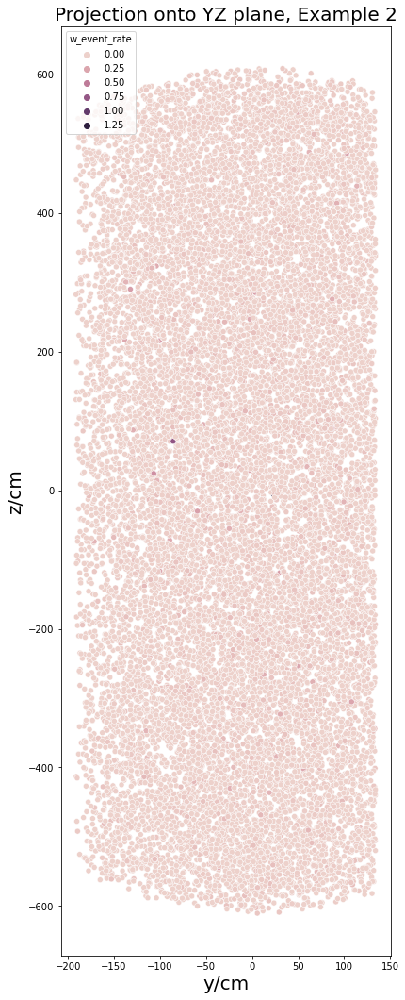

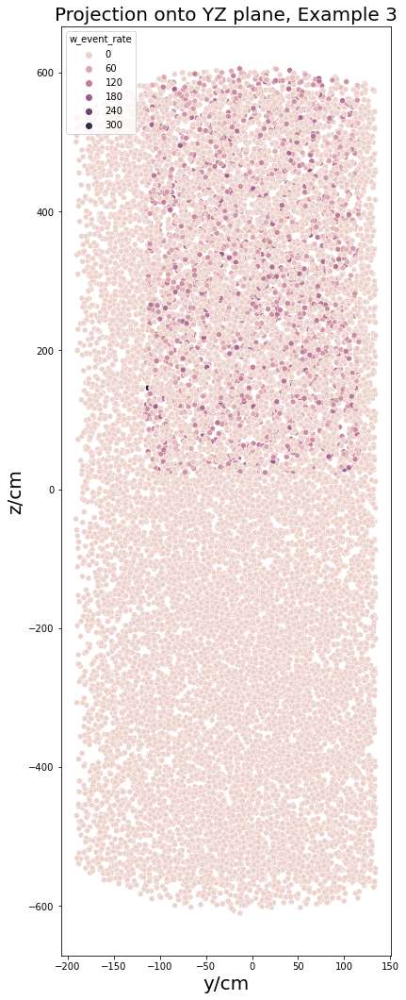

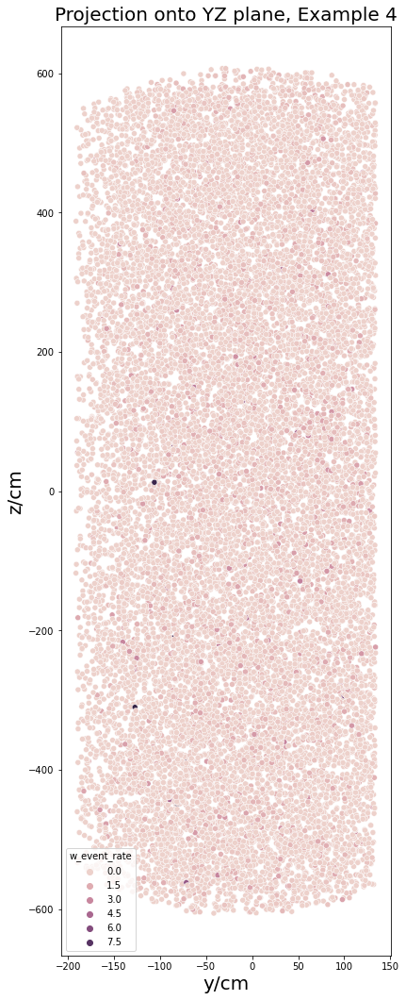

In [43]:
bp_list = ['1','2','3','4']
df_list = [df1_decay,df2_decay,df3_decay,df4_decay]

for case in range(4):
    bp = bp_list[case]
    df_scat = df_list[case].copy(deep=True)
    title = r"Projection onto YZ plane, Example " + bp
    xlabel = r'y/cm'
    ylabel = r'z/cm'
    
    axes_form  =[0.16,0.16,0.81,0.76]
    fig = plt.figure(figsize=(6,18))
    ax = fig.add_axes(axes_form, rasterized=False)
    ax.patch.set_alpha(0.0)
    
    sns.scatterplot(df_scat['pos_scatt', '2'], df_scat['pos_scatt', '3'], hue=df_scat['w_event_rate'])    
    
    ax.set_title(title,fontsize=20)
    ax.set_xlabel(xlabel,fontsize=20)
    ax.set_ylabel(ylabel,fontsize=20)

# Decay position

Considering points with a short and very long lifetimes.

/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/usr

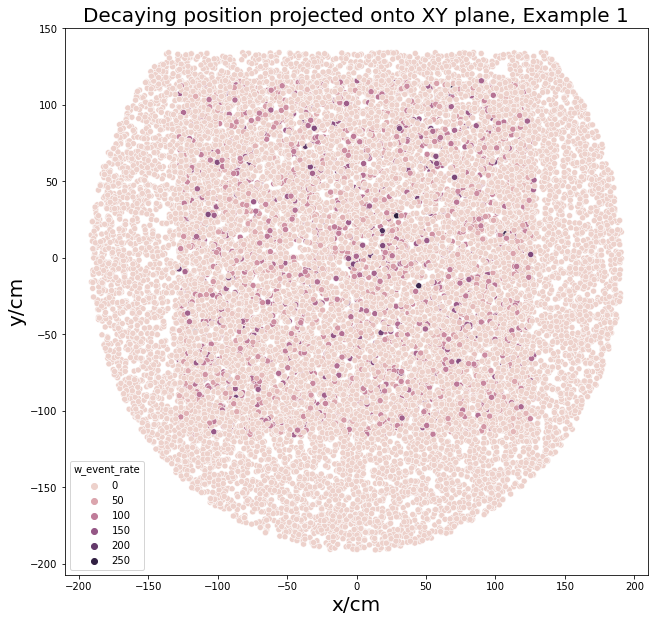

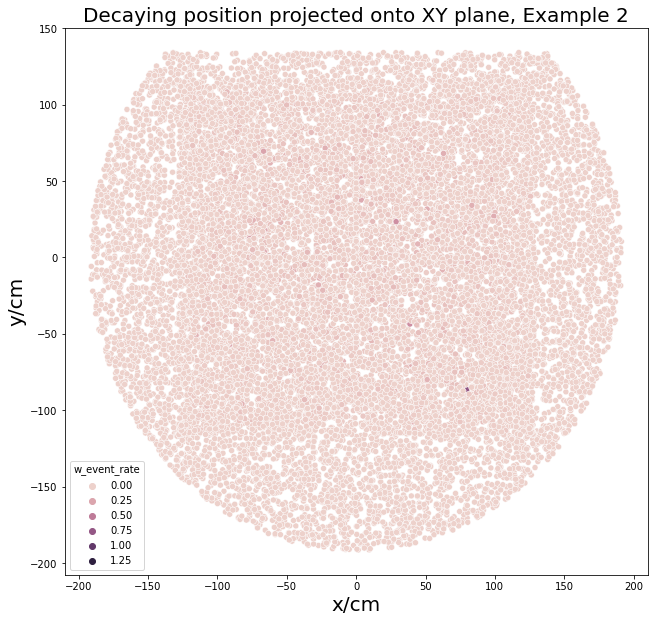

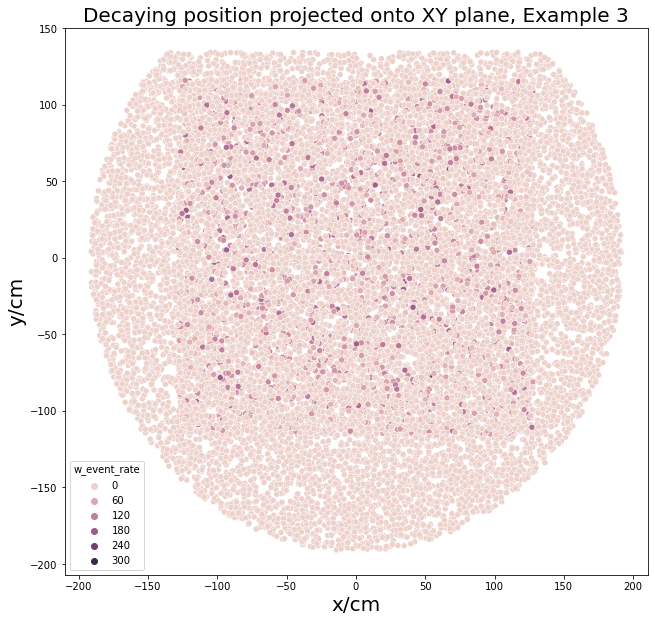

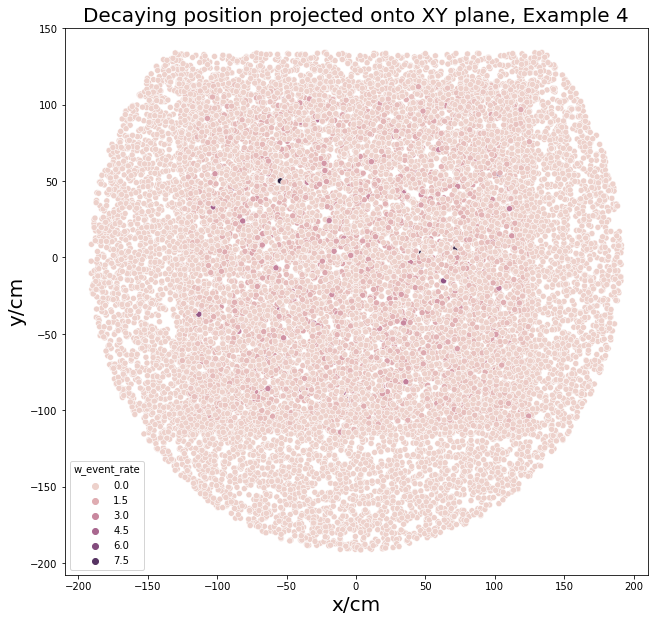

In [47]:
bp_list = ['1','2','3','4']
df_list = [df1_decay,df2_decay,df3_decay,df4_decay]

for case in range(4):
    bp = bp_list[case]
    df_scat = df_list[case].copy(deep=True)
    title = r"Decaying position projected onto XY plane, Example "+bp
    xlabel = r'x/cm'
    ylabel = r'y/cm'
    
    axes_form  =[0.16,0.16,0.81,0.76]
    fig = plt.figure(figsize=(10,10))
    ax = fig.add_axes(axes_form, rasterized=False)
    ax.patch.set_alpha(0.0)
    sns.scatterplot(df_scat['pos_decay', '1'], df_scat['pos_decay', '2'], hue=df_scat['w_event_rate'])
    ax.set_title(title,fontsize=20)
    ax.set_xlabel(xlabel,fontsize=20)
    ax.set_ylabel(ylabel,fontsize=20)

/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/usr

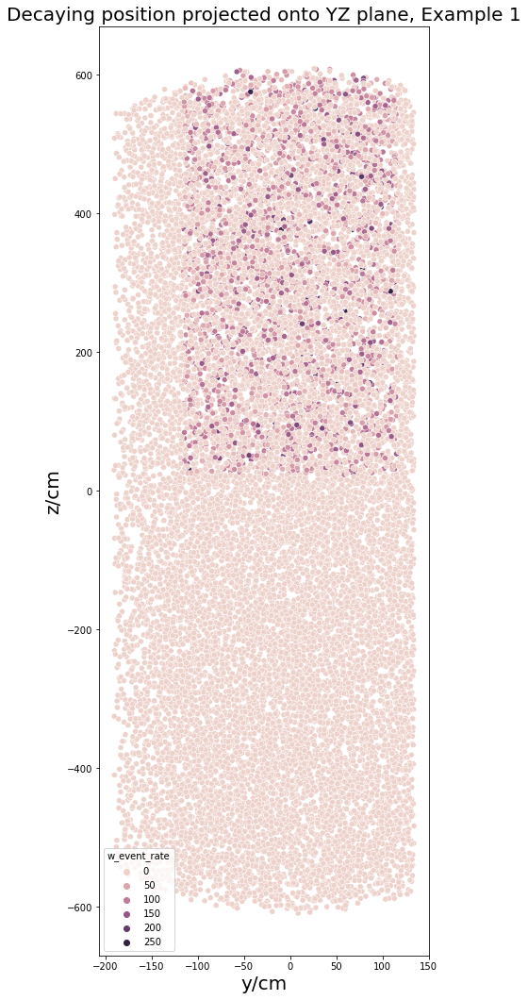

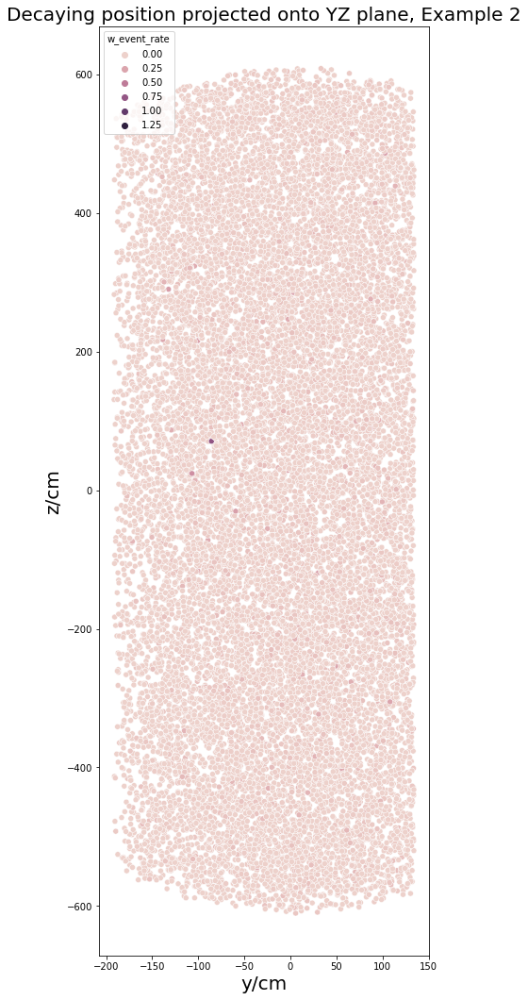

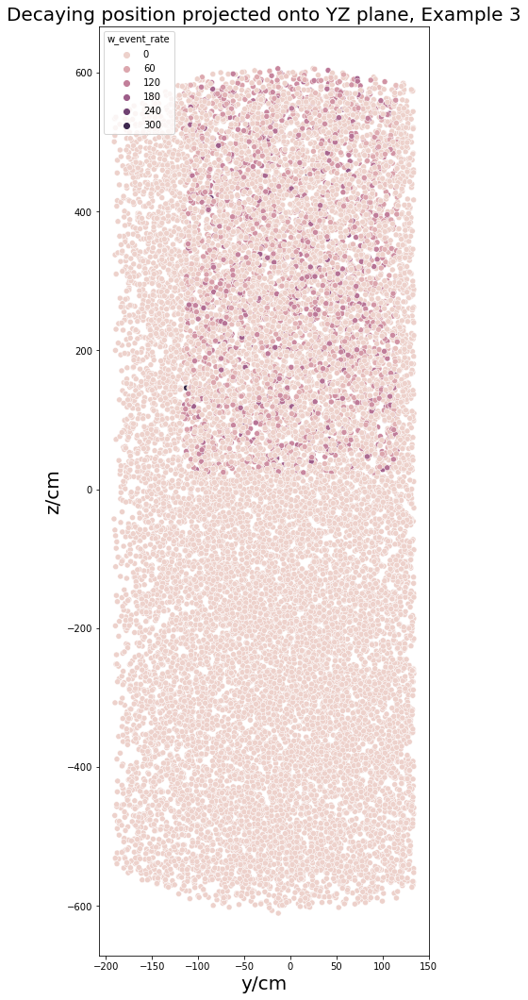

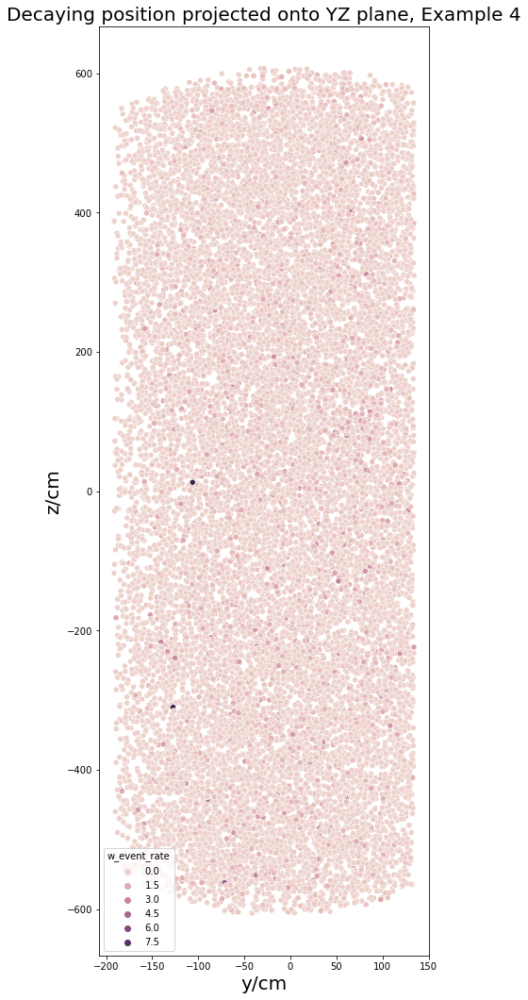

In [48]:
bp_list = ['1','2','3','4']
df_list = [df1_decay,df2_decay,df3_decay,df4_decay]

for case in range(4):
    bp = bp_list[case]
    df_scat = df_list[case].copy(deep=True)
    title = r"Decaying position projected onto YZ plane, Example "+bp
    xlabel = r'y/cm'
    ylabel = r'z/cm'
    
    axes_form  =[0.16,0.16,0.81,0.76]
    fig = plt.figure(figsize=(6,18))
    ax = fig.add_axes(axes_form, rasterized=False)
    ax.patch.set_alpha(0.0)
    sns.scatterplot(df_scat['pos_scatt', '2'], df_scat['pos_scatt', '3'], hue=df_scat['w_event_rate'])    
    ax.set_title(title,fontsize=20)
    ax.set_xlabel(xlabel,fontsize=20)
    ax.set_ylabel(ylabel,fontsize=20)